In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
import os

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("The used device will be", device)

The used device will be cuda


In [7]:
root_folder = 'C:/Users/aditu/Desktop/Proiecte/leaf/data'
train_dir = root_folder + '/train'
val_dir = root_folder + '/valid'

In [4]:
print('The number of classes of this dataset is:', len(os.listdir(train_dir)))

The number of classes of this dataset is: 38


In [5]:
total_images = 0
for x in os.listdir(train_dir):
    print(f"The amount of images in class {x} is {len(os.listdir(train_dir + '/' + x))}")
    total_images +=  len(os.listdir(train_dir + '/' + x))

print("Total number of images is", total_images)

The amount of images in class Apple___Apple_scab is 2016
The amount of images in class Apple___Black_rot is 1987
The amount of images in class Apple___Cedar_apple_rust is 1760
The amount of images in class Apple___healthy is 2008
The amount of images in class Blueberry___healthy is 1816
The amount of images in class Cherry_(including_sour)___healthy is 1826
The amount of images in class Cherry_(including_sour)___Powdery_mildew is 1683
The amount of images in class Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot is 1642
The amount of images in class Corn_(maize)___Common_rust_ is 1907
The amount of images in class Corn_(maize)___healthy is 1859
The amount of images in class Corn_(maize)___Northern_Leaf_Blight is 1908
The amount of images in class Grape___Black_rot is 1888
The amount of images in class Grape___Esca_(Black_Measles) is 1920
The amount of images in class Grape___healthy is 1692
The amount of images in class Grape___Leaf_blight_(Isariopsis_Leaf_Spot) is 1722
The amount of

We can see that the amount of images in each class is pretty balanced, spanning from 1642 images in Corn_(maize)___Cercospora_leaf_spot to 2010 images in the Orange___Haunglongbing_(Citrus_greening) class.

Now, we need to transform the images to tensors, and make some adjustments with compose (for example we will rotate some of the images for more generalization of the dataset)

In [5]:
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

valid_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

The scope of this project is to compare a custom made Neural Network to some pre-trained succesful models (such as ResNet, VGG) and for that to happen we need to resize the images to 224 x 224 and normalize them in the way that those big models have done too to their images.

In [8]:
train_dataset = datasets.ImageFolder(train_dir, transform = train_transforms)
valid_dataset = datasets.ImageFolder(val_dir, transform = valid_transforms)

train_loader = DataLoader(train_dataset, batch_size = 32, shuffle = True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size = 32, shuffle = False, num_workers= 4) #it doesn't matter if we shuffle when we are validating


In [15]:
class_names = train_dataset.classes

Having our data ready, let's make our custom CNN model. The reason for making this model is to have a baseline of comparation when we will fine-tune the pre-trained models.

In [9]:
import torch.nn as nn
import torch.nn.functional as F

class CNN_model(nn.Module):
    def __init__(self, num_classes = 38):
        super(CNN_model, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc1 = nn.Linear(128*28*28, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.pool(F.relu(self.conv3(x)))

        x = torch.flatten(x, 1)
        
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [10]:
model = CNN_model(num_classes=len(class_names)).to(device)
model

CNN_model(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=38, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [11]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
from tqdm import tqdm
import torch

num_epochs = 10
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for inputs, labels in train_pbar:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_samples += labels.size(0)
        correct_predictions += (predicted == labels).sum().item()

        train_pbar.set_postfix({
            'loss': running_loss/total_samples,
            'accuracy': 100. * correct_predictions/total_samples
        })

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = correct_predictions / len(train_loader.dataset)
    train_loss_history.append(epoch_loss)
    train_acc_history.append(epoch_acc)

    model.eval()
    val_running_loss = 0.0
    val_correct_predictions = 0
    val_total_samples = 0
    
    with torch.no_grad():
        val_pbar = tqdm(valid_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]")
        for inputs, labels in val_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            val_total_samples += labels.size(0)
            val_correct_predictions += (predicted == labels).sum().item()
            
            val_pbar.set_postfix({
                'loss': val_running_loss/val_total_samples,
                'accuracy': 100. * val_correct_predictions/val_total_samples
            })

    val_epoch_loss = val_running_loss / len(valid_loader.dataset)
    val_epoch_acc = val_correct_predictions / len(valid_loader.dataset)
    val_loss_history.append(val_epoch_loss)
    val_acc_history.append(val_epoch_acc)

    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, "
          f"Val Loss: {val_epoch_loss:.4f}, Val Acc: {val_epoch_acc:.4f}")

print("Finished Training")


Epoch 1/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.48it/s, loss=0.455, accuracy=85.8]


Epoch 1/10, Train Loss: 1.1514, Train Acc: 0.6542, Val Loss: 0.4552, Val Acc: 0.8579


Epoch 2/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.40it/s, loss=0.267, accuracy=91.1]


Epoch 2/10, Train Loss: 0.5218, Train Acc: 0.8372, Val Loss: 0.2671, Val Acc: 0.9113


Epoch 3/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.71it/s, loss=0.205, accuracy=93.4]


Epoch 3/10, Train Loss: 0.3744, Train Acc: 0.8824, Val Loss: 0.2055, Val Acc: 0.9344


Epoch 4/10 [Validation]: 100%|██████████| 550/550 [00:27<00:00, 19.93it/s, loss=0.142, accuracy=95.5]


Epoch 4/10, Train Loss: 0.3033, Train Acc: 0.9048, Val Loss: 0.1418, Val Acc: 0.9547


Epoch 5/10 [Validation]: 100%|██████████| 550/550 [00:24<00:00, 22.63it/s, loss=0.198, accuracy=93.8]


Epoch 5/10, Train Loss: 0.2504, Train Acc: 0.9219, Val Loss: 0.1977, Val Acc: 0.9381


Epoch 6/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.67it/s, loss=0.119, accuracy=96.3] 


Epoch 6/10, Train Loss: 0.2171, Train Acc: 0.9323, Val Loss: 0.1192, Val Acc: 0.9630


Epoch 7/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.58it/s, loss=0.154, accuracy=95.8]


Epoch 7/10, Train Loss: 0.1925, Train Acc: 0.9409, Val Loss: 0.1541, Val Acc: 0.9583


Epoch 8/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.58it/s, loss=0.158, accuracy=95.4]


Epoch 8/10, Train Loss: 0.1826, Train Acc: 0.9444, Val Loss: 0.1583, Val Acc: 0.9537


Epoch 9/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.32it/s, loss=0.132, accuracy=96.2] 


Epoch 9/10, Train Loss: 0.1605, Train Acc: 0.9514, Val Loss: 0.1319, Val Acc: 0.9625


Epoch 10/10 [Validation]: 100%|██████████| 550/550 [00:25<00:00, 21.72it/s, loss=0.113, accuracy=96.7] 

Epoch 10/10, Train Loss: 0.1465, Train Acc: 0.9555, Val Loss: 0.1132, Val Acc: 0.9671
Finished Training


Let's save this model for future comparisons to other models

In [ ]:
model_path = '.../saved_models/my_cnn.pth'

In [13]:
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

C:\Users\aditu\AppData\Local\Temp\ipykernel_13696\1481618732.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=de

CNN_model(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=38, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Now we should really see if our model predicts the images well. To do that we will take one image of every class in the validation set and see how many of the 38 classes can it predict right

In [13]:
def predict_image(img_tensor, model, class_names):
    img_tensor = img_tensor.to(device)
    xb = img_tensor.unsqueeze(0)

    with torch.no_grad():
        yb = model(xb)
    
    probs = F.softmax(yb, dim=1)
    _, preds = torch.max(probs, dim=1)
    return class_names[preds.item()]

In [ ]:
class_to_image_idx = {}
num_classes = len(valid_dataset.classes)

for i, class_idx in enumerate(valid_dataset.targets):
    if class_idx not in class_to_image_idx:
        class_to_image_idx[class_idx] = i
    if len(class_to_image_idx) == num_classes:
        break

print(f"Found one image for each of the {len(class_to_image_idx)} classes.")

Found one image for each of the 38 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..2.0648367].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.3088455].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..1.7511113].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..1.9254032].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7695861..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..1.7983193].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.929531

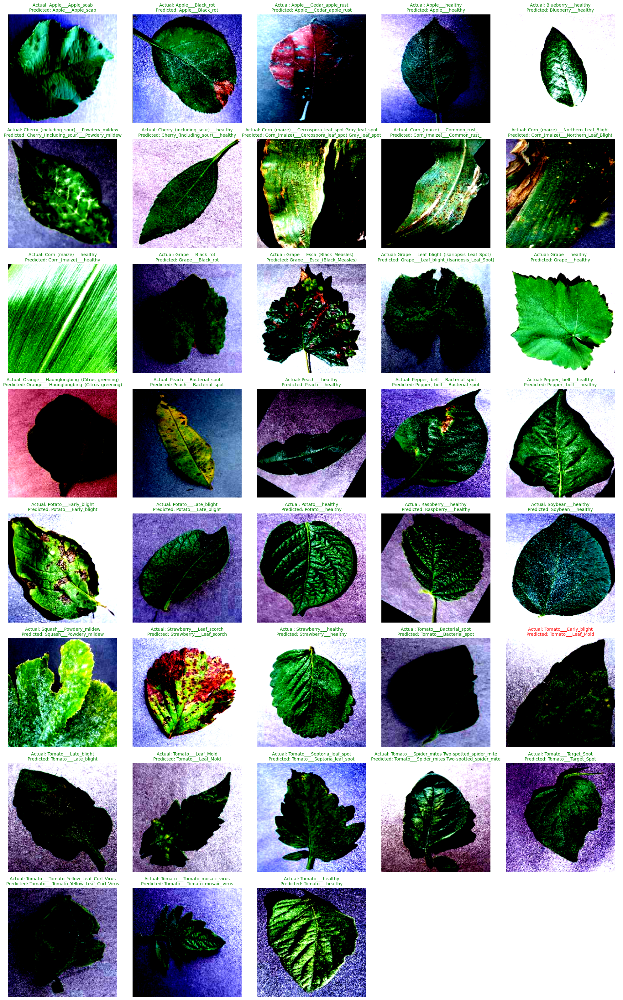

In [ ]:
fig, axes = plt.subplots(nrows=8, ncols=5, figsize=(20, 32))
axes = axes.flatten()

for class_idx, img_idx in sorted(class_to_image_idx.items()):

    img, label = valid_dataset[img_idx]
    
    predicted_class = predict_image(img, model, class_names)
    actual_class = class_names[label]

    ax = axes[class_idx]

    ax.imshow(img.permute(1, 2, 0))
    ax.axis('off')
    
    title_text = f"Actual: {actual_class}\nPredicted: {predicted_class}"
    
    if predicted_class == actual_class:
        ax.set_title(title_text, color="green", fontsize=10)
    else:
        ax.set_title(title_text, color="red", fontsize=10)

for i in range(num_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

We got 37 out of 38, which means we have roughly a 97% accuracy on this test. This checks out with the statistics of the training, where we got around 96% accuracy.

### Now we should see if our predictions are made by our model checking the leaf or the background
This is very important because we need to make sure that an user with a different background checks for a specific disease, they will get consistent predictions. 

In [1]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image

In [10]:
model = CNN_model()
model_path = 'C:/Users/aditu/Desktop/Proiecte/leaf/saved_models/my_cnn.pth'
model.load_state_dict(torch.load(model_path))

C:\Users\aditu\AppData\Local\Temp\ipykernel_3404\2442337219.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


<All keys matched successfully>

In [22]:
device

device(type='cuda')

In [23]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

In [ ]:
def show_grad_cam(model, target_layer, img_tensor, actual_class, target_class_idx=None, class_names=None, device='cpu'):
    """
    Runs Grad-CAM on an image and displays the original vs. heatmap.
    
    Args:
        model: torch.nn.Module
        target_layer: the layer/module to attach Grad-CAM to
        img_tensor: torch tensor (C,H,W)
        actual_class: string (label for display)
        target_class_idx: int, optional (which class to explain)
        class_names: list of class names
        device: 'cpu' or 'cuda'
    """
    model.to(device)
    model.eval()

    input_tensor = img_tensor.unsqueeze(0).to(device)

    target_layers = [target_layer]

    if target_class_idx is None:
        with torch.no_grad():
            output = model(input_tensor)
            target_class_idx = int(output.argmax(dim=1).item())
    targets = [ClassifierOutputTarget(target_class_idx)]
    predicted_class = class_names[target_class_idx] if class_names else str(target_class_idx)

    cam = GradCAM(model=model, target_layers=target_layers)

    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]


    rgb_img = img_tensor.permute(1, 2, 0).cpu().numpy()


    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    if np.max(rgb_img) > 1.0 or np.min(rgb_img) < 0.0:
        rgb_img = (rgb_img * std + mean)
    rgb_img = np.clip(rgb_img, 0, 1).astype(np.float32)


    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(rgb_img)
    ax1.set_title(f"Actual: {actual_class}")
    ax1.axis('off')

    ax2.imshow(visualization)
    ax2.set_title(f"Model Predicted: {predicted_class}")
    ax2.axis('off')

    plt.show()


In [24]:
model.to(device)

CNN_model(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=38, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Found failure at index 9!

--- Analyzing Failure (Index 9) ---
Model INCORRECTLY predicted: 'Squash___Powdery_mildew'
Actual class was: 'Apple___Apple_scab'


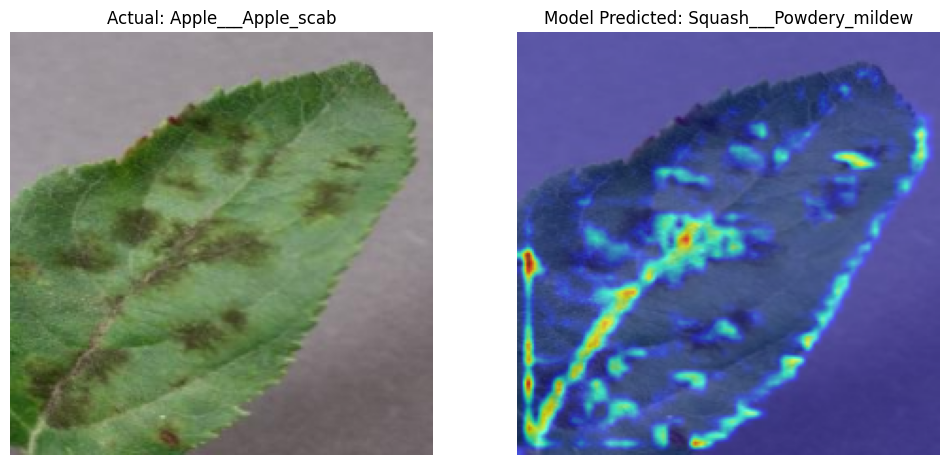

In [ ]:
target_layer_for_cam = model.conv3 

failed_image_idx = -1
failed_image = None
true_label = -1
predicted_label = ""

for i in range(len(valid_dataset)):
    img, label = valid_dataset[i]
    prediction = predict_image(img, model, class_names)

    if prediction != class_names[label]:
        print(f"Found failure at index {i}!")
        failed_image_idx = i
        failed_image = img
        true_label = label
        predicted_label = prediction
        break

if failed_image_idx != -1:
    print(f"\n--- Analyzing Failure (Index {failed_image_idx}) ---")
    print(f"Model INCORRECTLY predicted: '{predicted_label}'")
    print(f"Actual class was: '{class_names[true_label]}'")

    wrong_class_idx = class_names.index(predicted_label)

    show_grad_cam(
        model,
        target_layer_for_cam,
        failed_image,
        actual_class=class_names[true_label],
        target_class_idx=wrong_class_idx,
        class_names=class_names,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    )
else:
    print("Could not find any failed images to analyze. Your model is perfect!")



--- Analyzing a Success (Image at Index 100) ---
Image is: 'Apple___Apple_scab'


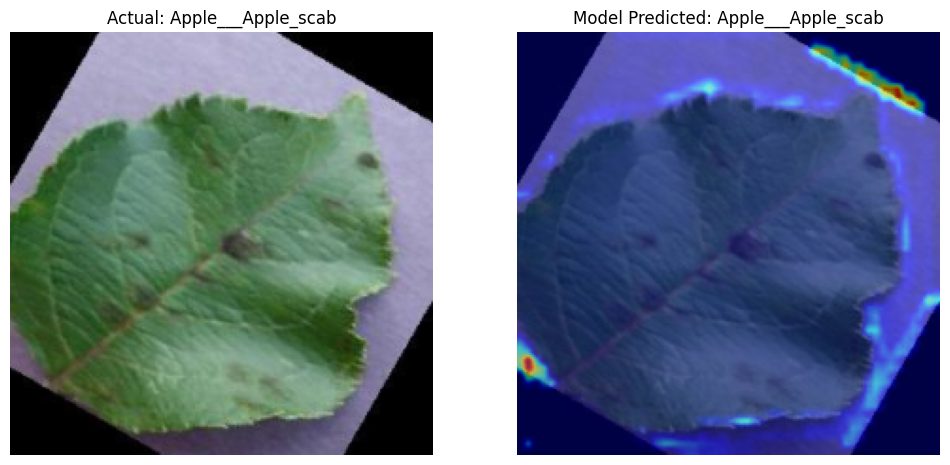

In [29]:
print("\n--- Analyzing a Success (Image at Index 100) ---")
img_success, label_success = valid_dataset[2]   # ✅ Make sure 100 < len(val_ds)
actual_class_success = class_names[label_success]
print(f"Image is: '{actual_class_success}'")

show_grad_cam(
    model,
    target_layer_for_cam,
    img_success,
    actual_class=actual_class_success,
    class_names=class_names,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)


We can clearly see that our model lacks when we look at how the weights are distributed across the image.

### Now, it's time to compare our home-made model to some other great models
We will fine-tune state-of-the-art models and then see the comparisons

In [33]:
import torchvision.models as models

base_model_resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

We will begin with ResNet18, the smallest of the models here

In [41]:
for param in base_model_resnet18.parameters():
    param.requires_grad = True

In [42]:
for param in base_model_resnet18.layer4.parameters():  # last residual block
    param.requires_grad = True

In [43]:
num_classes = len(class_names)
in_features = base_model_resnet18.fc.in_features  # for ResNet
base_model_resnet18.fc = nn.Linear(in_features, num_classes)

In [44]:
base_model_resnet18.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(base_model_resnet18.parameters(), lr=1e-4)

In [38]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=5):
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")
    return model

In [45]:
dataloaders = {'train': train_loader, 'val': valid_loader}
fine_tuned_model = train_model(base_model_resnet18, dataloaders, criterion, optimizer, num_epochs=5)


Epoch 1/5
Train Loss: 0.1521 Acc: 0.9658
Val Loss: 0.0405 Acc: 0.9872

Epoch 2/5
Train Loss: 0.0323 Acc: 0.9905
Val Loss: 0.0227 Acc: 0.9928

Epoch 3/5
Train Loss: 0.0232 Acc: 0.9930
Val Loss: 0.0153 Acc: 0.9951

Epoch 4/5
Train Loss: 0.0193 Acc: 0.9938
Val Loss: 0.0133 Acc: 0.9956

Epoch 5/5
Train Loss: 0.0141 Acc: 0.9960
Val Loss: 0.0118 Acc: 0.9967


In [ ]:
def evaluate_model(model, dataloader):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    acc = 100 * correct / total
    return acc


Original model accuracy: 96.71%
Fine-tuned model accuracy: 2.32%


In [46]:
acc_cnn = evaluate_model(model, valid_loader)
acc_finetuned_res18 = evaluate_model(fine_tuned_model, valid_loader)

In [47]:
print(f"Original model accuracy: {acc_cnn:.2f}%")
print(f"Fine-tuned model accuracy: {acc_finetuned_res18:.2f}%")

Original model accuracy: 96.71%
Fine-tuned model accuracy: 99.67%


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..1.6291069].


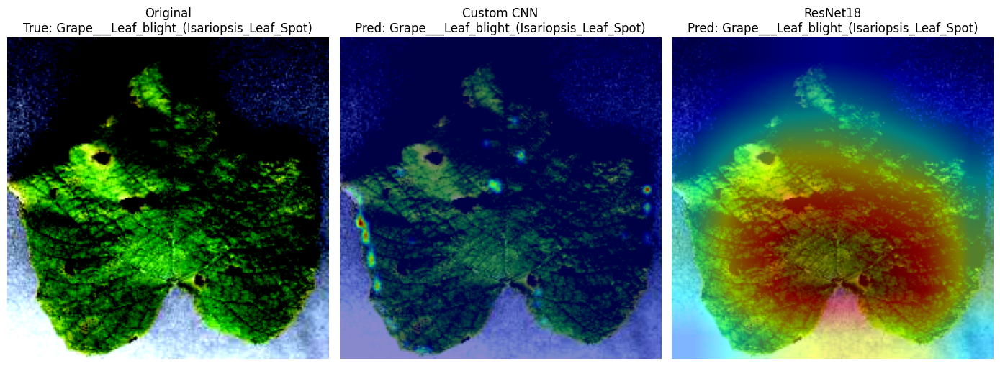

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9295317..1.0713727].


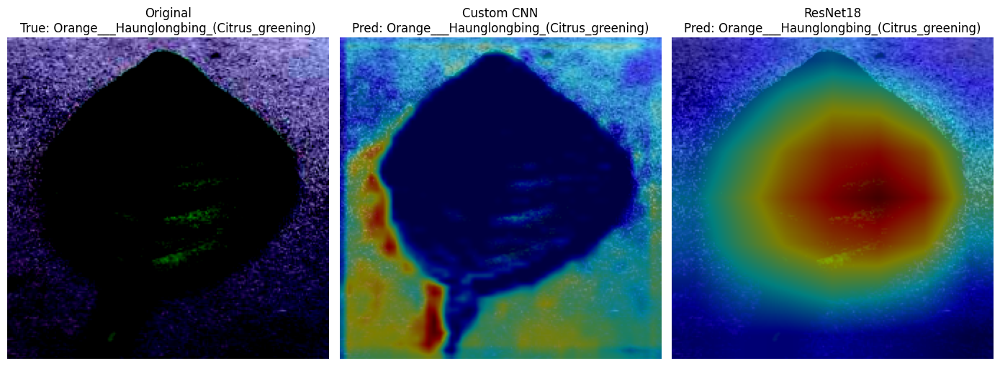

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.5528543].


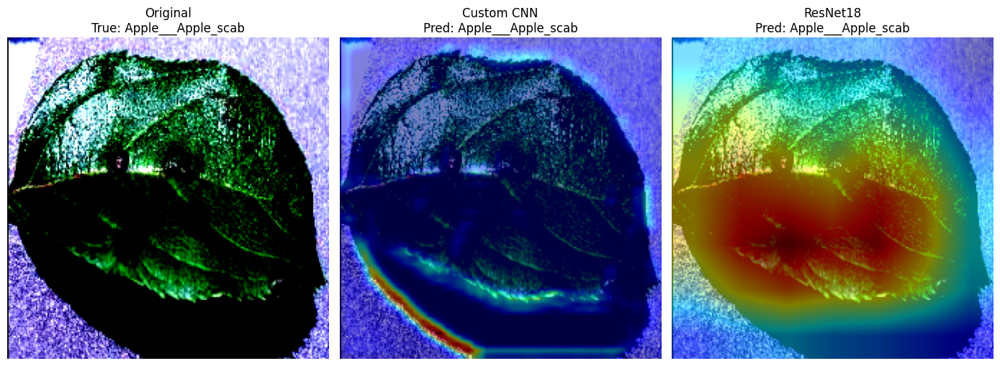

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..1.907974].


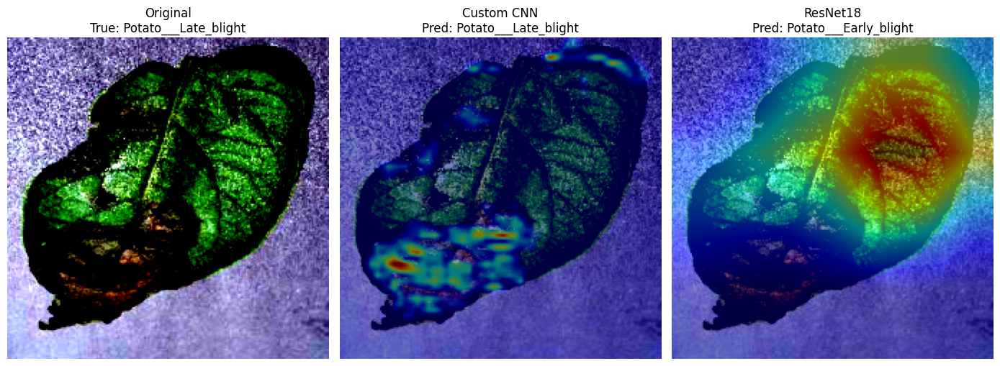

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.490719..1.8731157].


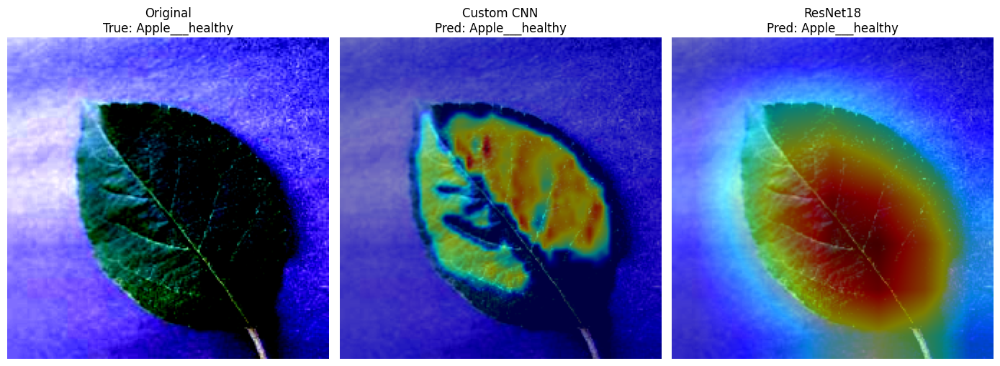

In [48]:
model.to(device)
fine_tuned_model.to(device)

model.eval()
fine_tuned_model.eval()

def get_gradcam_visualization(model, target_layer, img_tensor, device, class_idx=None):
    input_tensor = img_tensor.unsqueeze(0).to(device)
    cam = GradCAM(model=model, target_layers=[target_layer])
    targets = None
    if class_idx is not None:
        targets = [ClassifierOutputTarget(class_idx)]
    
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    rgb_img = img_tensor.permute(1, 2, 0).cpu().numpy()
    rgb_img = np.clip(rgb_img, 0, 1)
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    return visualization

indices = np.random.choice(len(valid_dataset), size=5, replace=False)

target_layer_resnet = fine_tuned_model.layer4[-1]
target_layer_custom = model.conv3

for idx in indices:
    img, label = valid_dataset[idx]
    img_input = img.to(device).float()

    with torch.no_grad():
        pred_custom = torch.argmax(fine_tuned_model(img_input.unsqueeze(0)), dim=1).item()
        pred_resnet = torch.argmax(model(img_input.unsqueeze(0)), dim=1).item()

    true_label = class_names[label]
    pred_custom_label = class_names[pred_custom]
    pred_resnet_label = class_names[pred_resnet]

    cam_custom = get_gradcam_visualization(model, target_layer_custom, img, device, class_idx=pred_custom)
    cam_resnet = get_gradcam_visualization(fine_tuned_model, target_layer_resnet, img, device, class_idx=pred_resnet)

    fig, axs = plt.subplots(1, 3, figsize=(14, 5))
    axs[0].imshow(img.permute(1, 2, 0))
    axs[0].set_title(f"Original\nTrue: {true_label}")
    axs[0].axis('off')

    axs[1].imshow(cam_custom)
    axs[1].set_title(f"Custom CNN\nPred: {pred_custom_label}")
    axs[1].axis('off')

    axs[2].imshow(cam_resnet)
    axs[2].set_title(f"ResNet18\nPred: {pred_resnet_label}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


That is a major difference between the two models. It shows how a state-of-the-art model like ResNet18 can outperform the usual custom made neural network.

In [49]:
model_path_resnet18 = 'C:/Users/aditu/Desktop/Proiecte/leaf/saved_models/fine_tuned_res18.pth'

In [50]:
torch.save(fine_tuned_model.state_dict(), model_path_resnet18)